#PLAYZAP CONTRACT ADDRESS ANALYSIS
#0x6ad9E9c098a45B2B41b519119C31c3DcB02ACcB2

In [ ]:
# Who is the most statistically likely to default on a credit card payment?
# Import basic libraries
import numpy as np
import pandas as pd
# import visualization libraries
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/MiamiCrypto/Data-Sets/main/PlayZapContract.csv')
df.head()

,Txhash,Blockno,UnixTimestamp,DateTime (UTC),From,To,Quantity,Method
0,0xe030b2114e5d9232a3087ac8ae640a8190b9a4bbd02a...,31347761,1693528722,9/1/2023 0:38,0xe93889fc4e526d30b3387c83469e594ae1971682,0x6ad9e9c098a45b2b41b519119c31c3dcb02accb2,8.4,Transfer
1,0xf146a73bfb629a521f727ec21b521145ac08a97dcf5f...,31351353,1693539557,9/1/2023 3:39,0x8a0c3f3b4ac3b2a1b6e45b5f277d84ba816fcb20,0x6ad9e9c098a45b2b41b519119c31c3dcb02accb2,4,Transfer
2,0xa8d3f94a4151fafc94cba4347a28d0321585ef81dcc2...,31352635,1693543404,9/1/2023 4:43,0x0f6103854dbe14a81bfb67c517062ccd130c5b38,0xa9a6f93b2c0b6d08924fc5ee2b81e01d40d746bc,"1,110.82",Multicall
3,0xdc72f750c41b6df26c4c2f27f6cc2b707aac38110787...,31352635,1693543404,9/1/2023 4:43,0xa9a6f93b2c0b6d08924fc5ee2b81e01d40d746bc,0x6ee4722d9b32b35755e281dcd92bda7cd71551f2,770.8499649,-
4,0x76a72f0145e4d07d94119c0cbe8e0bc8b278860423cc...,31352784,1693543851,9/1/2023 4:50,0x6ee4722d9b32b35755e281dcd92bda7cd71551f2,0x53f78a071d04224b8e254e243fffc6d9f2f3fa23,770.8499649,Transfer


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Txhash          5000 non-null   object
 1   Blockno         5000 non-null   int64 
 2   UnixTimestamp   5000 non-null   int64 
 3   DateTime (UTC)  5000 non-null   object
 4   From            5000 non-null   object
 5   To              5000 non-null   object
 6   Quantity        5000 non-null   object
 7   Method          5000 non-null   object
dtypes: int64(2), object(6)
memory usage: 312.6+ KB


In [ ]:
df.isnull().sum()

Txhash            0
Blockno           0
UnixTimestamp     0
DateTime (UTC)    0
From              0
To                0
Quantity          0
Method            0
dtype: int64

In [ ]:
df['Quantity'] = df['Quantity'].str.replace(',','')
df['Quantity'] = df['Quantity'].astype(float)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Txhash          5000 non-null   object
 1   Blockno         5000 non-null   int64 
 2   UnixTimestamp   5000 non-null   int64 
 3   DateTime (UTC)  5000 non-null   object
 4   From            5000 non-null   object
 5   To              5000 non-null   object
 6   Quantity        5000 non-null   object
 7   Method          5000 non-null   object
dtypes: int64(2), object(6)
memory usage: 312.6+ KB


In [ ]:
# Assuming 'From' is the sender column and 'To' is the receiver column in your dataset
top_senders = df.groupby('From')['Quantity'].sum().sort_values(ascending=False).head(n=10)
top_receivers = df.groupby('To')['Quantity'].sum().sort_values(ascending=False).head(n=10)

# You can choose 'n' as per your requirement, e.g., top 10 or top 20 addresses

In [ ]:
df_sorted_ascending = df.sort_values(by='Quantity', ascending=True)
df_sorted_ascending

,Txhash,Blockno,UnixTimestamp,DateTime (UTC),From,To,Quantity,Method
3483,0x435d1d69455ce11469d82a334c35145e4037ff5a191d...,31798828,1694886856,9/16/2023 17:54,0x2abd8a469fe2f4142f2a9bd68b2ce390f14039e3,0x5641a3e08e06ee9787e7ff1f7c53284c7602abe3,0.000000e+00,Transfer
1403,0xaa72c750de05047d746aa488261e74d4548f067efaa0...,31657737,1694462254,9/11/2023 19:57,0x3eecc796b8aa53d139404c13a3610c16a17e5af6,0x8ff27d359eeec198733b8e83438061ee3955e3fc,0.000000e+00,Transfer
2124,0xe0b59bc11b6b14b56973df7f313477f5fa4db216efd9...,31733553,1694690315,9/14/2023 11:18,0xdef171fe48cf0115b1d80b88dc8eab59176fee57,0xd5b927956057075377263aab7f8afc12f85100db,1.500000e-17,Swap
1422,0xd40e204c628e404d418729c0d1b52ab968001dbbae92...,31658761,1694465342,9/11/2023 20:49,0x996730db3c8ef2aa6bfbd3fa9c99a8201f97a5db,0xa9a6f93b2c0b6d08924fc5ee2b81e01d40d746bc,1.505030e-05,Add Liquidity
1421,0xd40e204c628e404d418729c0d1b52ab968001dbbae92...,31658761,1694465342,9/11/2023 20:49,0xa9a6f93b2c0b6d08924fc5ee2b81e01d40d746bc,0x996730db3c8ef2aa6bfbd3fa9c99a8201f97a5db,1.505030e-05,Add Liquidity
...,...,...,...,...,...,...,...,...
4764,0xfbb9020c9c5b55833a92975149cda88f68ddfd42978d...,31808804,1694916945,9/17/2023 2:15,0x53f78a071d04224b8e254e243fffc6d9f2f3fa23,0x67053e9d7584974282801e76b0594ecafae11f84,6.111061e+04,Transfer
459,0x70a0a5adc134a87a8ab1a55363ca12634e6c9c83dff6...,31536879,1694098757,9/7/2023 14:59,0xad581fc408ef4cff7492ab9109ab37374f0c2c16,0xd840bf981fc9a2cfedef3800ee6c16c80ab97d20,7.000000e+04,Transfer
278,0xd29dc8a5802adccea63e77b85661158d0f35104e50c1...,31467705,1693889660,9/5/2023 4:54,0xc5174f8344054bf8ddc6b91ad27b508a133610f8,0xad581fc408ef4cff7492ab9109ab37374f0c2c16,7.431219e+04,Claim Distribution
588,0xd6dc0a5349bf118a3a1dfc193d169364409842513d2c...,31560517,1694169880,9/8/2023 10:44,0xd840bf981fc9a2cfedef3800ee6c16c80ab97d20,0x0d0707963952f2fba59dd06f2b425ace40b492fe,7.499022e+04,Transfer


In [ ]:
# Re-aggregate buy volumes
buy_volumes = df.groupby('To')['Quantity'].sum()

# Re-aggregate sell volumes
sell_volumes = df.groupby('From')['Quantity'].sum()

# Merge the buy and sell volumes into one DataFrame
combined_volumes = pd.concat([buy_volumes, sell_volumes], axis=1, keys=['BuyVolume', 'SellVolume']).fillna(0)

# Display the first few rows of the combined volumes
combined_volumes.head()


,BuyVolume,SellVolume
0x0000000000001b0ead393ec554c5230004590aa4,3307.955358,3307.955358
0x0000000000007cf14b1600832c7a2f4fbe143033,106.206417,106.206417
0x000000000000b6b4c2dc4f3f12159df0163f67e9,216.201410,216.201410
0x000000000000d43e334f64e2ae7a8cf488f9ca91,22285.490089,22285.510089
0x0000000000222b212ea77112c9a39b95fa7140e5,2263.477658,2263.477658


In [ ]:
# Define a threshold for "large amount"
threshold = 10000

# Filter addresses that have bought more than the threshold and have made at least one sell transaction
large_buyers_and_sellers = combined_volumes[(combined_volumes['BuyVolume'] > threshold) & (combined_volumes['SellVolume'] > 0)]

large_buyers_and_sellers

,BuyVolume,SellVolume
0x000000000000d43e334f64e2ae7a8cf488f9ca91,22285.490089,22285.510089
0x0000000000f73a9daf39d74d785f5886bfbae81b,50141.323550,50141.323900
0x0000000000f83bf708c3e3bd57f24411f6fc67f5,50300.214811,50300.214811
0x000000016618ec01b08ef100f3e79bda22830420,11663.580540,11663.580540
0x0000005593693b59ace3e0c50981aaeee42c528b,100672.624918,100672.624918
...,...,...
0xf5f6a4a2a3466b26c7f161258fc47ff5800c0116,16235.130000,18225.000000
0xf66f81507c94f24d25ecbe3e7c9b6e3639405d36,18126.080000,10000.000000
0xf6746732080c26efd4d555cad9642cd194ebe248,33912.340000,33912.340000
0xfc1dfbbb7084ec0e1f5ae3c95b7204e67327681f,14465.610000,14465.610000


In [ ]:
# For the identified addresses, extract relevant data from the original dataset
filtered_data = df[(df['From'].isin(large_buyers_and_sellers.index)) | (df['To'].isin(large_buyers_and_sellers.index))]

# Extract earliest and latest buy dates
earliest_buy_dates = filtered_data.groupby('To')['DateTime (UTC)'].min()
latest_buy_dates = filtered_data.groupby('To')['DateTime (UTC)'].max()

# Extract earliest and latest sell dates
earliest_sell_dates = filtered_data.groupby('From')['DateTime (UTC)'].min()
latest_sell_dates = filtered_data.groupby('From')['DateTime (UTC)'].max()

# Merge all the extracted details into one DataFrame
transaction_details = pd.concat([
    earliest_buy_dates,
    latest_buy_dates,
    earliest_sell_dates,
    latest_sell_dates,
    large_buyers_and_sellers
], axis=1, keys=[
    'EarliestBuyDate', 'LatestBuyDate', 'EarliestSellDate', 'LatestSellDate', 'Volumes'
])

# Filter only the addresses identified previously
transaction_details = transaction_details.loc[large_buyers_and_sellers.index]

transaction_details.head()

EarliestBuyDate   LatestBuyDate  \
                                             DateTime (UTC)  DateTime (UTC)   
0x000000000000d43e334f64e2ae7a8cf488f9ca91  9/11/2023 18:28  9/4/2023 17:36   
0x0000000000f73a9daf39d74d785f5886bfbae81b  9/10/2023 12:33  9/9/2023 20:14   
0x0000000000f83bf708c3e3bd57f24411f6fc67f5  9/11/2023 16:44  9/9/2023 22:11   
0x000000016618ec01b08ef100f3e79bda22830420  9/15/2023 18:25  9/17/2023 3:59   
0x0000005593693b59ace3e0c50981aaeee42c528b  9/11/2023 16:41  9/9/2023 22:02   

                                           EarliestSellDate  LatestSellDate  \
                                             DateTime (UTC)  DateTime (UTC)   
0x000000000000d43e334f64e2ae7a8cf488f9ca91  9/11/2023 18:28  9/4/2023 17:36   
0x0000000000f73a9daf39d74d785f5886bfbae81b  9/10/2023 12:33  9/9/2023 20:14   
0x0000000000f83bf708c3e3bd57f24411f6fc67f5  9/11/2023 16:44  9/9/2023 22:11   
0x000000016618ec01b08ef100f3e79bda22830420  9/15/2023 18:25  9/17/2023 3:59   
0x0000005593693b59ace3e0c50981aaeee42c528b  9/11/2023 16:41  9/9/2023 22:02   

                                                  Volumes                 
                                                BuyVolume     SellVolume  
0x000000000000d43e334f64e2ae7a8cf488f9ca91   22285.490089   22285.510089  
0x0000000000f73a9daf39d74d785f5886bfbae81b   50141.323550   50141.323900  
0x0000000000f83bf708c3e3bd57f24411f6fc67f5   50300.214811   50300.214811  
0x000000016618ec01b08ef100f3e79bda22830420   11663.580540   11663.580540  
0x0000005593693b59ace3e0c50981aaeee42c528b  100672.624918  100672.624918

In [ ]:
# Define thresholds for significant buy and sell volumes
buy_threshold = 10000
sell_threshold = 5000

# Filter addresses based on the thresholds
significant_addresses = combined_volumes[
    (combined_volumes['BuyVolume'] > buy_threshold) &
    (combined_volumes['SellVolume'] > sell_threshold)
].index

# Extract buy and sell transaction dates for these addresses
buy_dates = df[df['To'].isin(significant_addresses)][['To', 'DateTime (UTC)']].rename(columns={'To': 'Address', 'DateTime (UTC)': 'BuyDate'})
sell_dates = df[df['From'].isin(significant_addresses)][['From', 'DateTime (UTC)']].rename(columns={'From': 'Address', 'DateTime (UTC)': 'SellDate'})

# Merge buy and sell dates
merged_dates = pd.merge(buy_dates, sell_dates, on='Address', how='outer').sort_values(by='Address')

merged_dates.head(10)  # Display the first 10 rows for a preview


,Address,BuyDate,SellDate
2110921,0x000000000000d43e334f64e2ae7a8cf488f9ca91,9/17/2023 0:02,9/16/2023 14:53
2110781,0x000000000000d43e334f64e2ae7a8cf488f9ca91,9/16/2023 21:12,9/16/2023 14:53
2110782,0x000000000000d43e334f64e2ae7a8cf488f9ca91,9/16/2023 21:12,9/16/2023 18:35
2110783,0x000000000000d43e334f64e2ae7a8cf488f9ca91,9/16/2023 21:12,9/16/2023 19:11
2110784,0x000000000000d43e334f64e2ae7a8cf488f9ca91,9/16/2023 21:12,9/16/2023 19:58
2110785,0x000000000000d43e334f64e2ae7a8cf488f9ca91,9/16/2023 21:12,9/16/2023 20:13
2110786,0x000000000000d43e334f64e2ae7a8cf488f9ca91,9/16/2023 21:12,9/16/2023 21:11
2110787,0x000000000000d43e334f64e2ae7a8cf488f9ca91,9/16/2023 21:12,9/16/2023 21:12
2110789,0x000000000000d43e334f64e2ae7a8cf488f9ca91,9/16/2023 21:12,9/16/2023 21:14
2110790,0x000000000000d43e334f64e2ae7a8cf488f9ca91,9/16/2023 21:12,9/16/2023 21:27


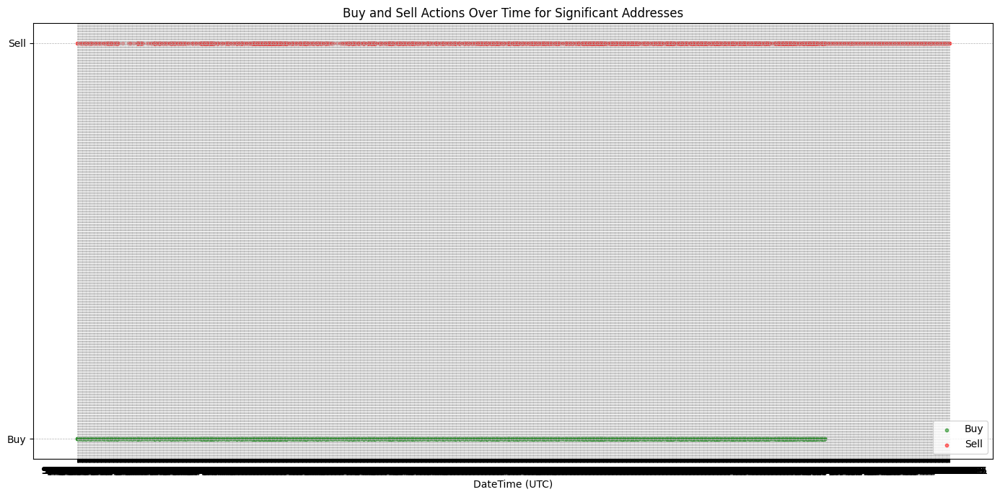

In [ ]:
import matplotlib.pyplot as plt

# Filter the data for the significant addresses
filtered_data = df[(df['From'].isin(significant_addresses)) | (df['To'].isin(significant_addresses))]

plt.figure(figsize=(14,7))

# Plot buy dates
buy_dates = filtered_data[filtered_data['To'].isin(significant_addresses)]['DateTime (UTC)']
plt.scatter(buy_dates, [1]*len(buy_dates), color='green', label='Buy', s=10, alpha=0.5)

# Plot sell dates
sell_dates = filtered_data[filtered_data['From'].isin(significant_addresses)]['DateTime (UTC)']
plt.scatter(sell_dates, [2]*len(sell_dates), color='red', label='Sell', s=10, alpha=0.5)

plt.yticks([1, 2], ["Buy", "Sell"])
plt.title("Buy and Sell Actions Over Time for Significant Addresses")
plt.xlabel("DateTime (UTC)")
plt.legend()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


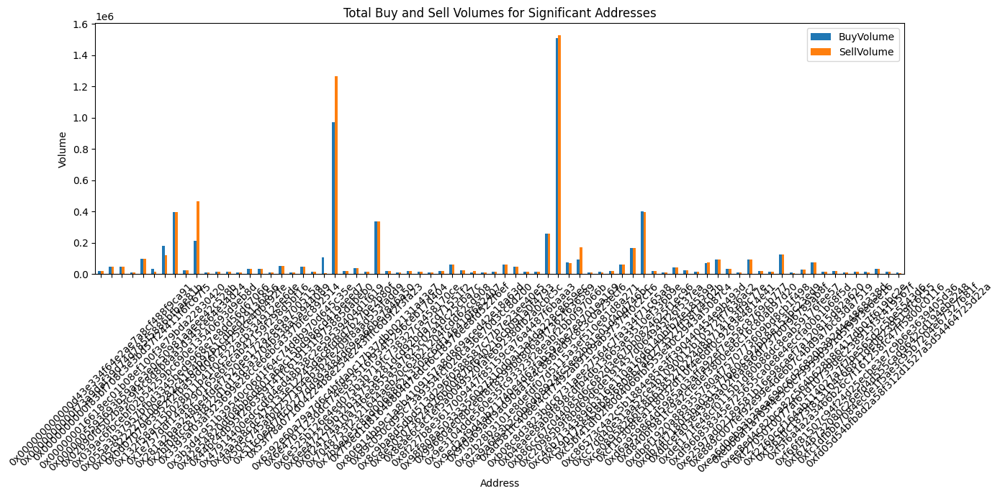

In [ ]:
buy_sell_volumes = combined_volumes.loc[significant_addresses]

# Plotting
buy_sell_volumes.plot(kind='bar', figsize=(14,7))
plt.title("Total Buy and Sell Volumes for Significant Addresses")
plt.ylabel("Volume")
plt.xlabel("Address")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

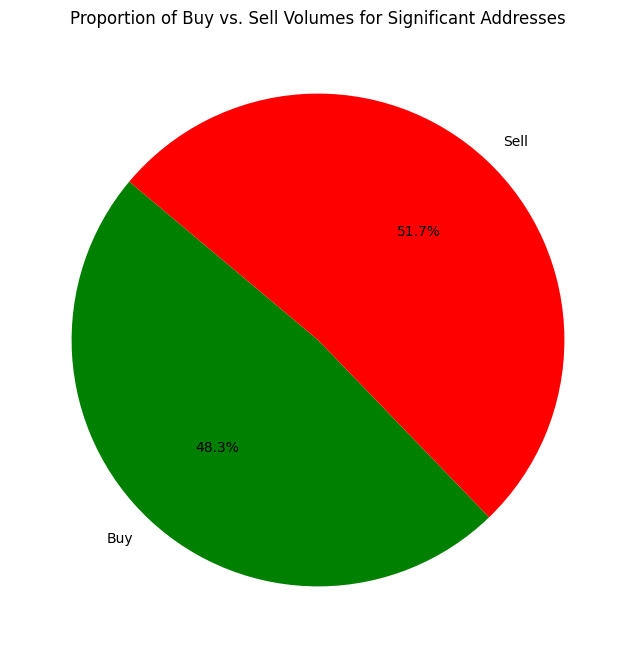

In [ ]:
# Sum of buy and sell volumes for all significant addresses
total_buy_volume = buy_sell_volumes['BuyVolume'].sum()
total_sell_volume = buy_sell_volumes['SellVolume'].sum()

# Data for pie chart
sizes = [total_buy_volume, total_sell_volume]
labels = ['Buy', 'Sell']
colors = ['green', 'red']

# Plotting
plt.figure(figsize=(8,8))
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
plt.title("Proportion of Buy vs. Sell Volumes for Significant Addresses")
plt.show()


In [ ]:
# Calculate the total holdings for each address (both bought and currently held)
total_holdings = df.groupby('To')['Quantity'].sum() - df.groupby('From')['Quantity'].sum()
total_holdings = total_holdings.fillna(0)

# Determine the quantile values
quantiles = total_holdings.quantile([0.25, 0.5, 0.75])

# Categorize the holders based on quantiles
def categorize_holder(holding):
    if holding >= quantiles[0.75]:
        return "Whale"
    elif holding >= quantiles[0.5]:
        return "Large Holder"
    elif holding >= quantiles[0.25]:
        return "Medium Holder"
    else:
        return "Small Holder"

holders_category = total_holdings.apply(categorize_holder)

# Get counts of each category
category_counts = holders_category.value_counts()

category_counts


Whale           872
Small Holder     88
Name: Quantity, dtype: int64

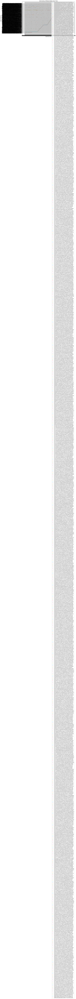

In [ ]:
# Filter addresses that are categorized as "Whale"
whale_addresses = holders_category[holders_category == "Whale"].index

# Filter the data for the whale addresses' sell activity
whale_sell_data = df[df['From'].isin(whale_addresses)]

# Visualization
plt.figure(figsize=(14,7))
for address in whale_addresses:
    sell_dates = whale_sell_data[whale_sell_data['From'] == address]['DateTime (UTC)']
    plt.scatter(sell_dates, [address]*len(sell_dates), label=address, s=10)

plt.title("Sell Activity of Whale Holders Over Time")
plt.xlabel("DateTime (UTC)")
plt.ylabel("Whale Addresses")
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.legend()
plt.show()


In [ ]:
# Sort the transactions by quantity to identify the highest volume transactions
top_impactful_transactions = df.sort_values(by="Quantity", ascending=False).head(10)

top_impactful_transactions

,Txhash,Blockno,UnixTimestamp,DateTime (UTC),From,To,Quantity,Method
3432,0xdffd24c0ad8c0e0b305f0444dd6a40d66639106e41f6...,31797757,1694883643,9/16/2023 17:00,0x53f78a071d04224b8e254e243fffc6d9f2f3fa23,0x67053e9d7584974282801e76b0594ecafae11f84,79746.68,Transfer
588,0xd6dc0a5349bf118a3a1dfc193d169364409842513d2c...,31560517,1694169880,9/8/2023 10:44,0xd840bf981fc9a2cfedef3800ee6c16c80ab97d20,0x0d0707963952f2fba59dd06f2b425ace40b492fe,74990.22,Transfer
278,0xd29dc8a5802adccea63e77b85661158d0f35104e50c1...,31467705,1693889660,9/5/2023 4:54,0xc5174f8344054bf8ddc6b91ad27b508a133610f8,0xad581fc408ef4cff7492ab9109ab37374f0c2c16,74312.19,Claim Distribution
459,0x70a0a5adc134a87a8ab1a55363ca12634e6c9c83dff6...,31536879,1694098757,9/7/2023 14:59,0xad581fc408ef4cff7492ab9109ab37374f0c2c16,0xd840bf981fc9a2cfedef3800ee6c16c80ab97d20,70000.00,Transfer
4764,0xfbb9020c9c5b55833a92975149cda88f68ddfd42978d...,31808804,1694916945,9/17/2023 2:15,0x53f78a071d04224b8e254e243fffc6d9f2f3fa23,0x67053e9d7584974282801e76b0594ecafae11f84,61110.61,Transfer
1663,0xd911061590454b0cc1c6196273a4bfbae525e7be579b...,31677956,1694523044,9/12/2023 12:50,0x8c9ba8d5dbd513d296f0588587c77b7e23ee40e5,0x53f78a071d04224b8e254e243fffc6d9f2f3fa23,60213.09,Transfer
1661,0x26a7b968981e502fc7b9c44a27848b9e581733726c9f...,31677645,1694522111,9/12/2023 12:35,0xc5174f8344054bf8ddc6b91ad27b508a133610f8,0xc46b71343896b316e110a16d6140bfb7fe185599,60213.09,Claim Distribution
1662,0xd9c7bccd1dd7c13b5c97a68b3fc1da0d9bfab311cfd1...,31677681,1694522219,9/12/2023 12:36,0xc46b71343896b316e110a16d6140bfb7fe185599,0x8c9ba8d5dbd513d296f0588587c77b7e23ee40e5,60213.09,Transfer
2191,0x287cd7137c74239ba9c9310086ca041a14f6f2480527...,31741166,1694713201,9/14/2023 17:40,0xb08c8d3823bdc6731aee27564c7fa334f71c65a8,0xa2b28b3101e8defdf07d5115a3ef510e81d8a271,53476.49,Withdraw
2192,0x287cd7137c74239ba9c9310086ca041a14f6f2480527...,31741166,1694713201,9/14/2023 17:40,0xa2b28b3101e8defdf07d5115a3ef510e81d8a271,0x51fc0e8f7ffc0277dd993484d69ea66be7846a50,53476.49,Withdraw


In [ ]:
# Filter addresses that are categorized as "Whale"
whale_addresses = holders_category[holders_category == "Whale"].index

# Initialize an empty DataFrame to collect top transactions for each whale
whale_transactions = pd.DataFrame()

# For each whale address, extract top incoming and outgoing transactions
for address in whale_addresses:
    # Incoming transactions (Buys)
    incoming = df[df['To'] == address].sort_values(by="Quantity", ascending=False).head(5)
    # Outgoing transactions (Sells)
    outgoing = df[df['From'] == address].sort_values(by="Quantity", ascending=False).head(5)
    # Concatenate and append to the main DataFrame
    whale_transactions = pd.concat([whale_transactions, incoming, outgoing])

# Sort the final DataFrame by Quantity to get the highest volume transactions on top
whale_transactions = whale_transactions.sort_values(by="Quantity", ascending=False)

whale_transactions


,Txhash,Blockno,UnixTimestamp,DateTime (UTC),From,To,Quantity,Method
3432,0xdffd24c0ad8c0e0b305f0444dd6a40d66639106e41f6...,31797757,1694883643,9/16/2023 17:00,0x53f78a071d04224b8e254e243fffc6d9f2f3fa23,0x67053e9d7584974282801e76b0594ecafae11f84,7.974668e+04,Transfer
278,0xd29dc8a5802adccea63e77b85661158d0f35104e50c1...,31467705,1693889660,9/5/2023 4:54,0xc5174f8344054bf8ddc6b91ad27b508a133610f8,0xad581fc408ef4cff7492ab9109ab37374f0c2c16,7.431219e+04,Claim Distribution
278,0xd29dc8a5802adccea63e77b85661158d0f35104e50c1...,31467705,1693889660,9/5/2023 4:54,0xc5174f8344054bf8ddc6b91ad27b508a133610f8,0xad581fc408ef4cff7492ab9109ab37374f0c2c16,7.431219e+04,Claim Distribution
459,0x70a0a5adc134a87a8ab1a55363ca12634e6c9c83dff6...,31536879,1694098757,9/7/2023 14:59,0xad581fc408ef4cff7492ab9109ab37374f0c2c16,0xd840bf981fc9a2cfedef3800ee6c16c80ab97d20,7.000000e+04,Transfer
4764,0xfbb9020c9c5b55833a92975149cda88f68ddfd42978d...,31808804,1694916945,9/17/2023 2:15,0x53f78a071d04224b8e254e243fffc6d9f2f3fa23,0x67053e9d7584974282801e76b0594ecafae11f84,6.111061e+04,Transfer
...,...,...,...,...,...,...,...,...
1421,0xd40e204c628e404d418729c0d1b52ab968001dbbae92...,31658761,1694465342,9/11/2023 20:49,0xa9a6f93b2c0b6d08924fc5ee2b81e01d40d746bc,0x996730db3c8ef2aa6bfbd3fa9c99a8201f97a5db,1.505030e-05,Add Liquidity
2124,0xe0b59bc11b6b14b56973df7f313477f5fa4db216efd9...,31733553,1694690315,9/14/2023 11:18,0xdef171fe48cf0115b1d80b88dc8eab59176fee57,0xd5b927956057075377263aab7f8afc12f85100db,1.500000e-17,Swap
3483,0x435d1d69455ce11469d82a334c35145e4037ff5a191d...,31798828,1694886856,9/16/2023 17:54,0x2abd8a469fe2f4142f2a9bd68b2ce390f14039e3,0x5641a3e08e06ee9787e7ff1f7c53284c7602abe3,0.000000e+00,Transfer
3483,0x435d1d69455ce11469d82a334c35145e4037ff5a191d...,31798828,1694886856,9/16/2023 17:54,0x2abd8a469fe2f4142f2a9bd68b2ce390f14039e3,0x5641a3e08e06ee9787e7ff1f7c53284c7602abe3,0.000000e+00,Transfer


In [ ]:
# Calculate the total holdings for each address
total_holdings = df.groupby('To')['Quantity'].sum() - df.groupby('From')['Quantity'].sum()
total_holdings = total_holdings.fillna(0)

# Define super whales as the top 1% of holders
super_whale_threshold = total_holdings.quantile(0.99)

# Filter addresses that are categorized as "Super Whale"
super_whale_addresses = total_holdings[total_holdings >= super_whale_threshold].index

# Number of super whales identified
num_super_whales = len(super_whale_addresses)

num_super_whales


10

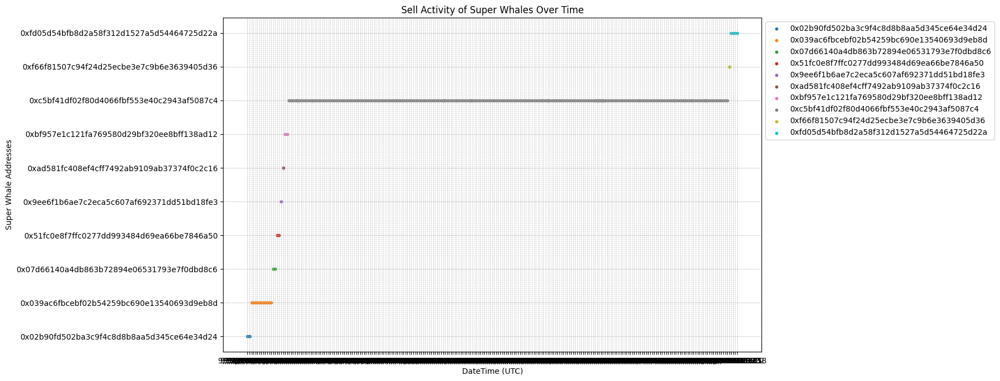

In [ ]:
import matplotlib.pyplot as plt

# Filter the data for the super whale addresses' sell activity
super_whale_sell_data = df[df['From'].isin(super_whale_addresses)]

plt.figure(figsize=(14,7))
for address in super_whale_addresses:
    sell_dates = super_whale_sell_data[super_whale_sell_data['From'] == address]['DateTime (UTC)']
    plt.scatter(sell_dates, [address]*len(sell_dates), label=address, s=10)

plt.title("Sell Activity of Super Whales Over Time")
plt.xlabel("DateTime (UTC)")
plt.ylabel("Super Whale Addresses")
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.legend(loc='upper left', bbox_to_anchor=(1,1))
plt.show()


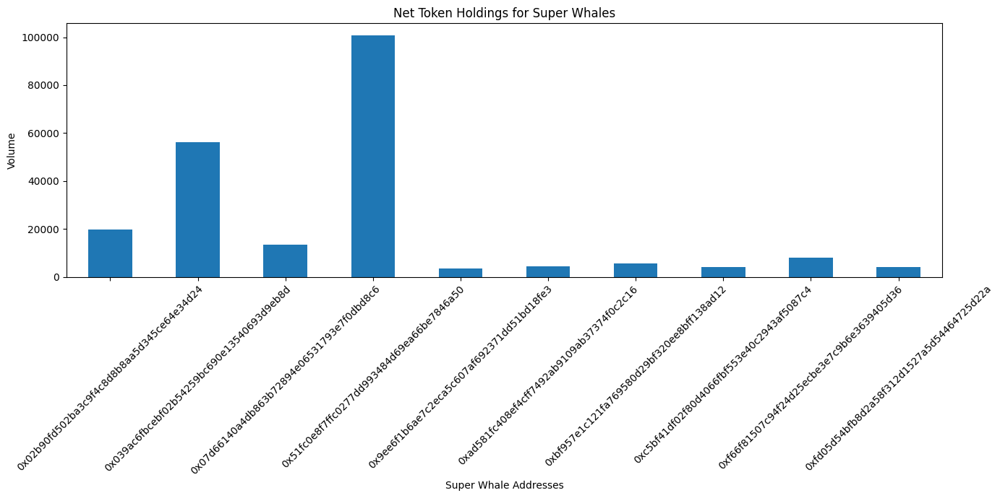

In [ ]:
# Extract buy and sell volumes for super whales
super_whale_volumes = df[df['To'].isin(super_whale_addresses)].groupby('To')['Quantity'].sum() - df[df['From'].isin(super_whale_addresses)].groupby('From')['Quantity'].sum()

# Plotting
super_whale_volumes.plot(kind='bar', figsize=(14,7))
plt.title("Net Token Holdings for Super Whales")
plt.ylabel("Volume")
plt.xlabel("Super Whale Addresses")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


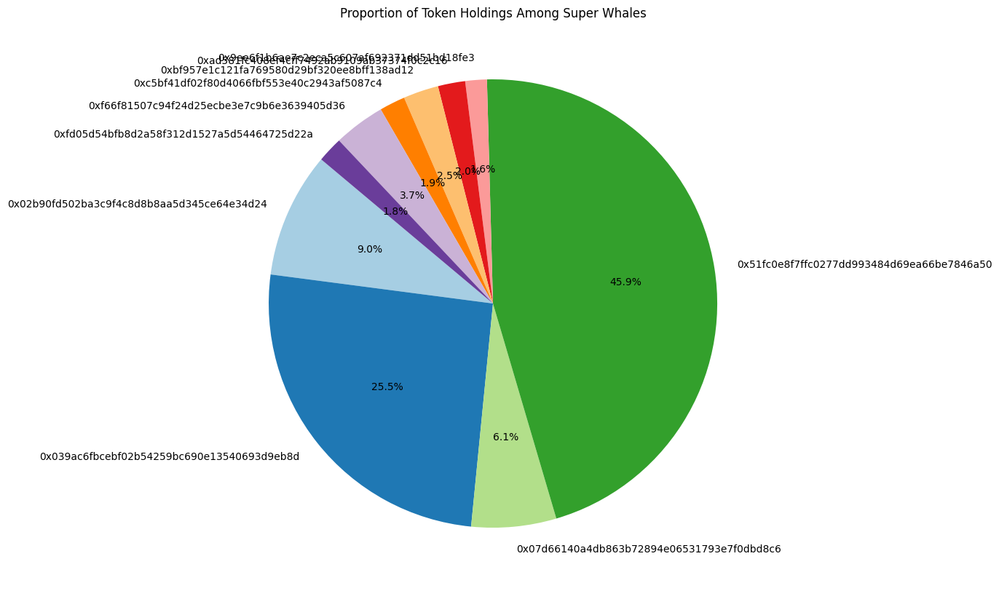

In [ ]:
# Data for pie chart
sizes = super_whale_volumes.values
labels = super_whale_volumes.index
colors = plt.cm.Paired(range(len(super_whale_addresses)))

# Plotting
plt.figure(figsize=(10,10))
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140)
plt.title("Proportion of Token Holdings Among Super Whales")
plt.show()


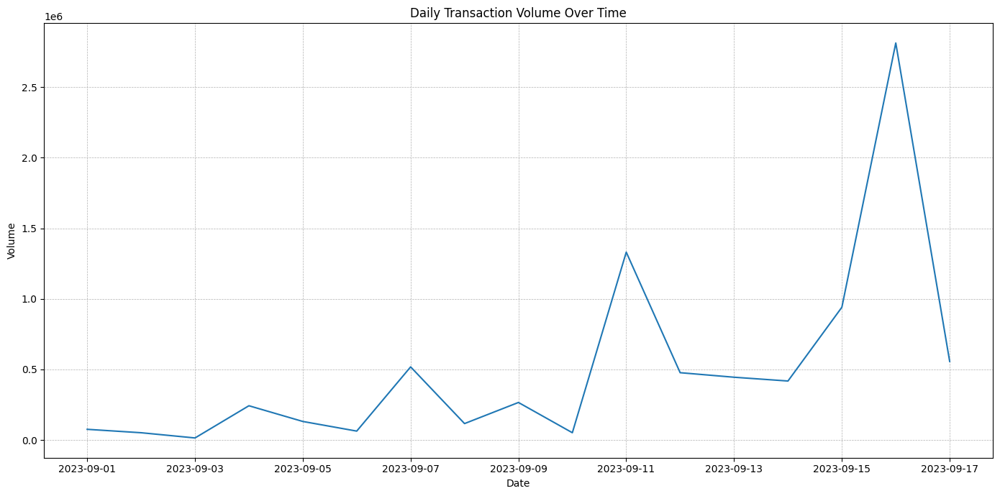

In [ ]:
# Convert the 'DateTime (UTC)' column to datetime format
df['DateTime (UTC)'] = pd.to_datetime(df['DateTime (UTC)'])

# Group by day and sum up the transaction volumes
daily_transaction_volume = df.groupby(df['DateTime (UTC)'].dt.date)['Quantity'].sum()

# Plotting
plt.figure(figsize=(14,7))
daily_transaction_volume.plot()
plt.title("Daily Transaction Volume Over Time")
plt.ylabel("Volume")
plt.xlabel("Date")
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


In [ ]:
# Grouping by day and aggregating the buy and sell volumes separately
daily_buy_volume = df[df['To'].isin(super_whale_addresses)].groupby(df['DateTime (UTC)'].dt.date)['Quantity'].sum()
daily_sell_volume = df[df['From'].isin(super_whale_addresses)].groupby(df['DateTime (UTC)'].dt.date)['Quantity'].sum()

# Identifying the peak buy and sell days
peak_buy_day = daily_buy_volume.idxmax()
peak_sell_day = daily_sell_volume.idxmax()

peak_buy_day, peak_sell_day

(datetime.date(2023, 9, 16), datetime.date(2023, 9, 16))

In [ ]:
# Filter transactions for September 16, 2023
peak_day_data = df[df['DateTime (UTC)'].dt.date == pd.to_datetime("2023-09-16")]

# Super whales' buy volumes on the peak day
whale_peak_buy_volumes = peak_day_data[peak_day_data['To'].isin(super_whale_addresses)].groupby('To')['Quantity'].sum()

# Super whales' sell volumes on the peak day
whale_peak_sell_volumes = peak_day_data[peak_day_data['From'].isin(super_whale_addresses)].groupby('From')['Quantity'].sum()

# Sorting the series to identify top buyers and sellers
top_whale_buyers = whale_peak_buy_volumes.sort_values(ascending=False)
top_whale_sellers = whale_peak_sell_volumes.sort_values(ascending=False)

top_whale_buyers, top_whale_sellers

<ipython-input-32-28bff134f319>:2: FutureWarning: Comparison of Timestamp with datetime.date is deprecated in order to match the standard library behavior. In a future version these will be considered non-comparable. Use 'ts == pd.Timestamp(date)' or 'ts.date() == date' instead.
  peak_day_data = df[df['DateTime (UTC)'].dt.date == pd.to_datetime("2023-09-16")]


(To
 0xc5bf41df02f80d4066fbf553e40c2943af5087c4    241257.428400
 0x039ac6fbcebf02b54259bc690e13540693d9eb8d     49657.435691
 0x02b90fd502ba3c9f4c8d8b8aa5d345ce64e34d24     18174.849463
 0x9ee6f1b6ae7c2eca5c607af692371dd51bd18fe3      1350.420000
 0xbf957e1c121fa769580d29bf320ee8bff138ad12      1019.601156
 Name: Quantity, dtype: float64,
 From
 0xc5bf41df02f80d4066fbf553e40c2943af5087c4    238048.70735
 0x039ac6fbcebf02b54259bc690e13540693d9eb8d     27193.89000
 0xf66f81507c94f24d25ecbe3e7c9b6e3639405d36     10000.00000
 Name: Quantity, dtype: float64)

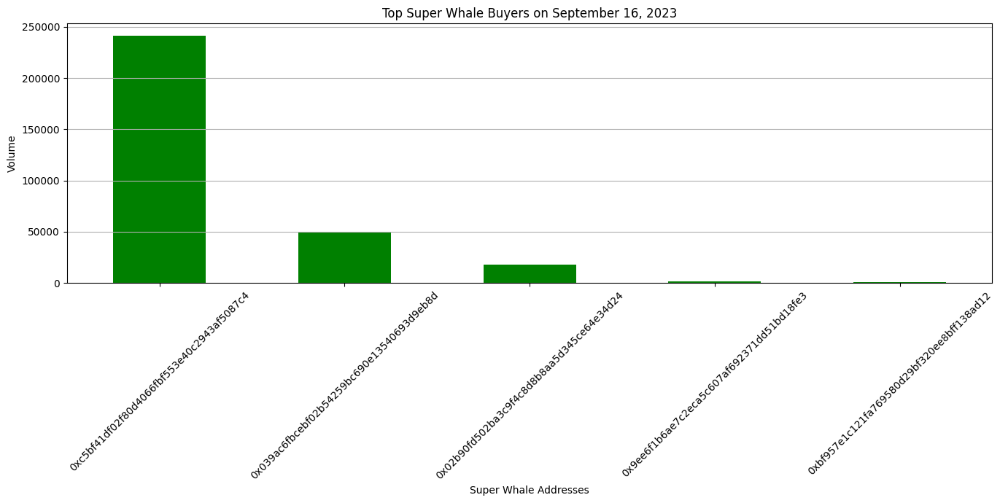

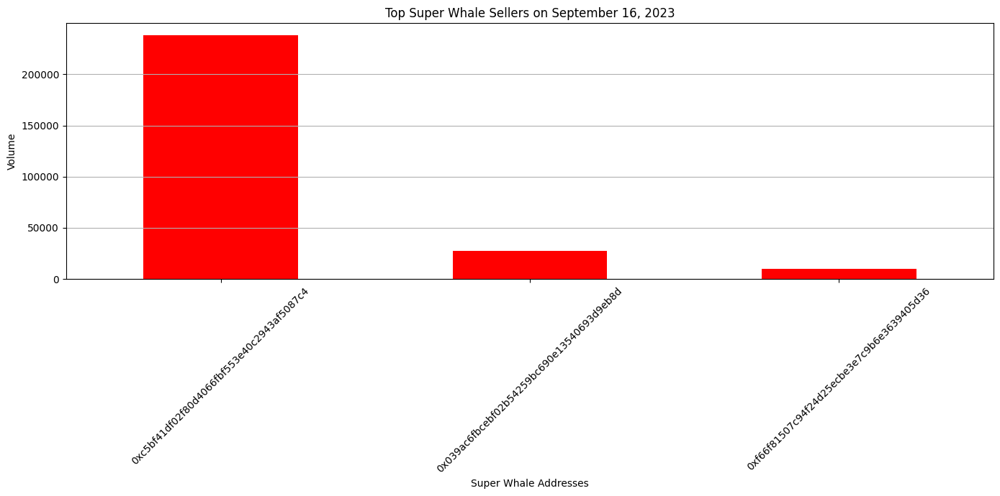

In [ ]:
import matplotlib.pyplot as plt

# Visualization for Top Buyers
plt.figure(figsize=(14,7))
top_whale_buyers.plot(kind='bar', color='green')
plt.title("Top Super Whale Buyers on September 16, 2023")
plt.ylabel("Volume")
plt.xlabel("Super Whale Addresses")
plt.xticks(rotation=45)
plt.tight_layout()
plt.grid(axis='y')
plt.show()

# Visualization for Top Sellers
plt.figure(figsize=(14,7))
top_whale_sellers.plot(kind='bar', color='red')
plt.title("Top Super Whale Sellers on September 16, 2023")
plt.ylabel("Volume")
plt.xlabel("Super Whale Addresses")
plt.xticks(rotation=45)
plt.tight_layout()
plt.grid(axis='y')
plt.show()


In [ ]:
# Sort column 'Quantity' in descending order
df_sorted_descending = df.sort_values(by='Quantity', ascending=False)
df_sorted_descending


,Txhash,Blockno,UnixTimestamp,DateTime (UTC),From,To,Quantity,Method
3432,0xdffd24c0ad8c0e0b305f0444dd6a40d66639106e41f6...,31797757,1694883643,2023-09-16 17:00:00,0x53f78a071d04224b8e254e243fffc6d9f2f3fa23,0x67053e9d7584974282801e76b0594ecafae11f84,7.974668e+04,Transfer
588,0xd6dc0a5349bf118a3a1dfc193d169364409842513d2c...,31560517,1694169880,2023-09-08 10:44:00,0xd840bf981fc9a2cfedef3800ee6c16c80ab97d20,0x0d0707963952f2fba59dd06f2b425ace40b492fe,7.499022e+04,Transfer
278,0xd29dc8a5802adccea63e77b85661158d0f35104e50c1...,31467705,1693889660,2023-09-05 04:54:00,0xc5174f8344054bf8ddc6b91ad27b508a133610f8,0xad581fc408ef4cff7492ab9109ab37374f0c2c16,7.431219e+04,Claim Distribution
459,0x70a0a5adc134a87a8ab1a55363ca12634e6c9c83dff6...,31536879,1694098757,2023-09-07 14:59:00,0xad581fc408ef4cff7492ab9109ab37374f0c2c16,0xd840bf981fc9a2cfedef3800ee6c16c80ab97d20,7.000000e+04,Transfer
4764,0xfbb9020c9c5b55833a92975149cda88f68ddfd42978d...,31808804,1694916945,2023-09-17 02:15:00,0x53f78a071d04224b8e254e243fffc6d9f2f3fa23,0x67053e9d7584974282801e76b0594ecafae11f84,6.111061e+04,Transfer
...,...,...,...,...,...,...,...,...
1422,0xd40e204c628e404d418729c0d1b52ab968001dbbae92...,31658761,1694465342,2023-09-11 20:49:00,0x996730db3c8ef2aa6bfbd3fa9c99a8201f97a5db,0xa9a6f93b2c0b6d08924fc5ee2b81e01d40d746bc,1.505030e-05,Add Liquidity
1421,0xd40e204c628e404d418729c0d1b52ab968001dbbae92...,31658761,1694465342,2023-09-11 20:49:00,0xa9a6f93b2c0b6d08924fc5ee2b81e01d40d746bc,0x996730db3c8ef2aa6bfbd3fa9c99a8201f97a5db,1.505030e-05,Add Liquidity
2124,0xe0b59bc11b6b14b56973df7f313477f5fa4db216efd9...,31733553,1694690315,2023-09-14 11:18:00,0xdef171fe48cf0115b1d80b88dc8eab59176fee57,0xd5b927956057075377263aab7f8afc12f85100db,1.500000e-17,Swap
1403,0xaa72c750de05047d746aa488261e74d4548f067efaa0...,31657737,1694462254,2023-09-11 19:57:00,0x3eecc796b8aa53d139404c13a3610c16a17e5af6,0x8ff27d359eeec198733b8e83438061ee3955e3fc,0.000000e+00,Transfer


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Txhash          5000 non-null   object        
 1   Blockno         5000 non-null   int64         
 2   UnixTimestamp   5000 non-null   int64         
 3   DateTime (UTC)  5000 non-null   datetime64[ns]
 4   From            5000 non-null   object        
 5   To              5000 non-null   object        
 6   Quantity        5000 non-null   float64       
 7   Method          5000 non-null   object        
dtypes: datetime64[ns](1), float64(1), int64(2), object(4)
memory usage: 312.6+ KB


In [ ]:
# Assuming you want to subset columns named 'ColumnA', 'ColumnB', and 'ColumnC'
df_subset = df[['DateTime (UTC)', 'From', 'To', 'Quantity','Method']]
df_subset

,DateTime (UTC),From,To,Quantity,Method
0,2023-09-01 00:38:00,0xe93889fc4e526d30b3387c83469e594ae1971682,0x6ad9e9c098a45b2b41b519119c31c3dcb02accb2,8.400000,Transfer
1,2023-09-01 03:39:00,0x8a0c3f3b4ac3b2a1b6e45b5f277d84ba816fcb20,0x6ad9e9c098a45b2b41b519119c31c3dcb02accb2,4.000000,Transfer
2,2023-09-01 04:43:00,0x0f6103854dbe14a81bfb67c517062ccd130c5b38,0xa9a6f93b2c0b6d08924fc5ee2b81e01d40d746bc,1110.820000,Multicall
3,2023-09-01 04:43:00,0xa9a6f93b2c0b6d08924fc5ee2b81e01d40d746bc,0x6ee4722d9b32b35755e281dcd92bda7cd71551f2,770.849965,-
4,2023-09-01 04:50:00,0x6ee4722d9b32b35755e281dcd92bda7cd71551f2,0x53f78a071d04224b8e254e243fffc6d9f2f3fa23,770.849965,Transfer
...,...,...,...,...,...
4995,2023-09-17 04:12:00,0xa9a6f93b2c0b6d08924fc5ee2b81e01d40d746bc,0x9ee5ba68b1d0a2dc48d3fc173b16870b3b57e558,1338.990000,-
4996,2023-09-17 04:12:00,0xb13d9a774f362675a19967b6be52cbacb26f9ef6,0xa9a6f93b2c0b6d08924fc5ee2b81e01d40d746bc,120.966045,-
4997,2023-09-17 04:12:00,0xd52a13a7cef550a8073744488d3410b598095a86,0xa9a6f93b2c0b6d08924fc5ee2b81e01d40d746bc,2104.000000,Multicall
4998,2023-09-17 04:12:00,0xa9a6f93b2c0b6d08924fc5ee2b81e01d40d746bc,0xb13d9a774f362675a19967b6be52cbacb26f9ef6,137.616751,-


In [ ]:
df['DateTime (UTC)'] = pd.to_datetime(df['DateTime (UTC)'])  # Convert the 'Date' column to datetime format
daily_transaction_count = df.groupby(df['DateTime (UTC)'].dt.date).size()
daily_transaction_count

DateTime (UTC)
2023-09-01      59
2023-09-02      61
2023-09-03      42
2023-09-04     111
2023-09-05      72
2023-09-06      54
2023-09-07     170
2023-09-08      61
2023-09-09     162
2023-09-10      66
2023-09-11     689
2023-09-12     289
2023-09-13     242
2023-09-14     132
2023-09-15     498
2023-09-16    1767
2023-09-17     525
dtype: int64

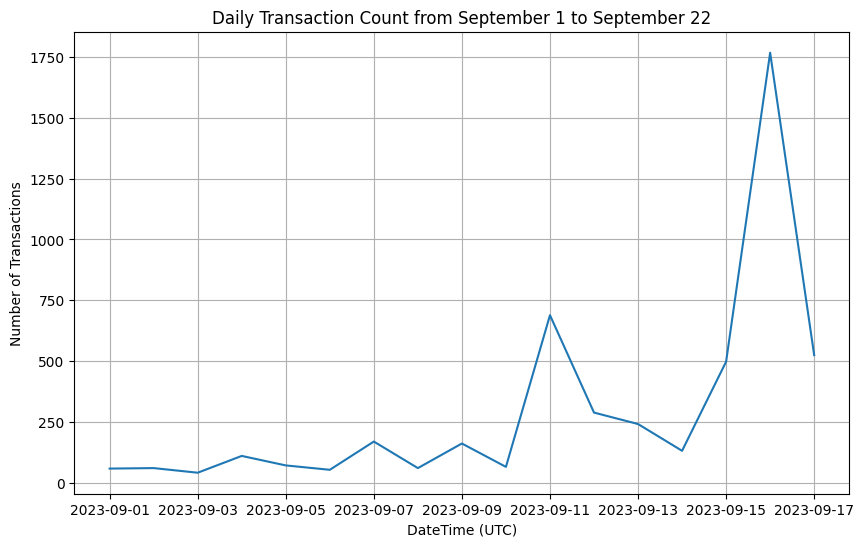

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
daily_transaction_count.plot()
plt.title("Daily Transaction Count from September 1 to September 22")
plt.xlabel("DateTime (UTC)")
plt.ylabel("Number of Transactions")
plt.grid(True)
plt.show()


In [ ]:
# Sort column 'Quantity' in descending order
df_sorted_descending = df_subset.sort_values(by='Quantity', ascending=False)
df_sorted_descending

,DateTime (UTC),From,To,Quantity,Method
3432,2023-09-16 17:00:00,0x53f78a071d04224b8e254e243fffc6d9f2f3fa23,0x67053e9d7584974282801e76b0594ecafae11f84,7.974668e+04,Transfer
588,2023-09-08 10:44:00,0xd840bf981fc9a2cfedef3800ee6c16c80ab97d20,0x0d0707963952f2fba59dd06f2b425ace40b492fe,7.499022e+04,Transfer
278,2023-09-05 04:54:00,0xc5174f8344054bf8ddc6b91ad27b508a133610f8,0xad581fc408ef4cff7492ab9109ab37374f0c2c16,7.431219e+04,Claim Distribution
459,2023-09-07 14:59:00,0xad581fc408ef4cff7492ab9109ab37374f0c2c16,0xd840bf981fc9a2cfedef3800ee6c16c80ab97d20,7.000000e+04,Transfer
4764,2023-09-17 02:15:00,0x53f78a071d04224b8e254e243fffc6d9f2f3fa23,0x67053e9d7584974282801e76b0594ecafae11f84,6.111061e+04,Transfer
...,...,...,...,...,...
1422,2023-09-11 20:49:00,0x996730db3c8ef2aa6bfbd3fa9c99a8201f97a5db,0xa9a6f93b2c0b6d08924fc5ee2b81e01d40d746bc,1.505030e-05,Add Liquidity
1421,2023-09-11 20:49:00,0xa9a6f93b2c0b6d08924fc5ee2b81e01d40d746bc,0x996730db3c8ef2aa6bfbd3fa9c99a8201f97a5db,1.505030e-05,Add Liquidity
2124,2023-09-14 11:18:00,0xdef171fe48cf0115b1d80b88dc8eab59176fee57,0xd5b927956057075377263aab7f8afc12f85100db,1.500000e-17,Swap
1403,2023-09-11 19:57:00,0x3eecc796b8aa53d139404c13a3610c16a17e5af6,0x8ff27d359eeec198733b8e83438061ee3955e3fc,0.000000e+00,Transfer


In [ ]:
# Identifying rows where 'ColumnName' has duplicate values
duplicates = df_subset[df_subset['To'].duplicated(keep=False)]
duplicates

,DateTime (UTC),From,To,Quantity,Method
0,2023-09-01 00:38:00,0xe93889fc4e526d30b3387c83469e594ae1971682,0x6ad9e9c098a45b2b41b519119c31c3dcb02accb2,8.400000,Transfer
1,2023-09-01 03:39:00,0x8a0c3f3b4ac3b2a1b6e45b5f277d84ba816fcb20,0x6ad9e9c098a45b2b41b519119c31c3dcb02accb2,4.000000,Transfer
2,2023-09-01 04:43:00,0x0f6103854dbe14a81bfb67c517062ccd130c5b38,0xa9a6f93b2c0b6d08924fc5ee2b81e01d40d746bc,1110.820000,Multicall
3,2023-09-01 04:43:00,0xa9a6f93b2c0b6d08924fc5ee2b81e01d40d746bc,0x6ee4722d9b32b35755e281dcd92bda7cd71551f2,770.849965,-
4,2023-09-01 04:50:00,0x6ee4722d9b32b35755e281dcd92bda7cd71551f2,0x53f78a071d04224b8e254e243fffc6d9f2f3fa23,770.849965,Transfer
...,...,...,...,...,...
4995,2023-09-17 04:12:00,0xa9a6f93b2c0b6d08924fc5ee2b81e01d40d746bc,0x9ee5ba68b1d0a2dc48d3fc173b16870b3b57e558,1338.990000,-
4996,2023-09-17 04:12:00,0xb13d9a774f362675a19967b6be52cbacb26f9ef6,0xa9a6f93b2c0b6d08924fc5ee2b81e01d40d746bc,120.966045,-
4997,2023-09-17 04:12:00,0xd52a13a7cef550a8073744488d3410b598095a86,0xa9a6f93b2c0b6d08924fc5ee2b81e01d40d746bc,2104.000000,Multicall
4998,2023-09-17 04:12:00,0xa9a6f93b2c0b6d08924fc5ee2b81e01d40d746bc,0xb13d9a774f362675a19967b6be52cbacb26f9ef6,137.616751,-


In [ ]:
# Assuming 'From' is the sender column and 'To' is the receiver column in your dataset
top_senders = df.groupby('From')['Quantity'].sum().sort_values(ascending=False).head(n=10)
top_receivers = df.groupby('To')['Quantity'].sum().sort_values(ascending=False).head(n=10)

# You can choose 'n' as per your requirement, e.g., top 10 or top 20 addresses

In [ ]:
# Extracting transactions for top senders
top_senders_transactions = df[df['From'].isin(top_senders.index)]

# Extracting transactions for top receivers
top_receivers_transactions = df[df['To'].isin(top_receivers.index)]


In [ ]:
contract_address = "YOUR_CONTRACT_ADDRESS"

# For top senders:
top_senders_sell = top_senders_transactions[top_senders_transactions['To'] == contract_address]
top_senders_buy = top_senders_transactions[top_senders_transactions['From'] == contract_address]

# For top receivers:
top_receivers_sell = top_receivers_transactions[top_receivers_transactions['To'] == contract_address]
top_receivers_buy = top_receivers_transactions[top_receivers_transactions['From'] == contract_address]


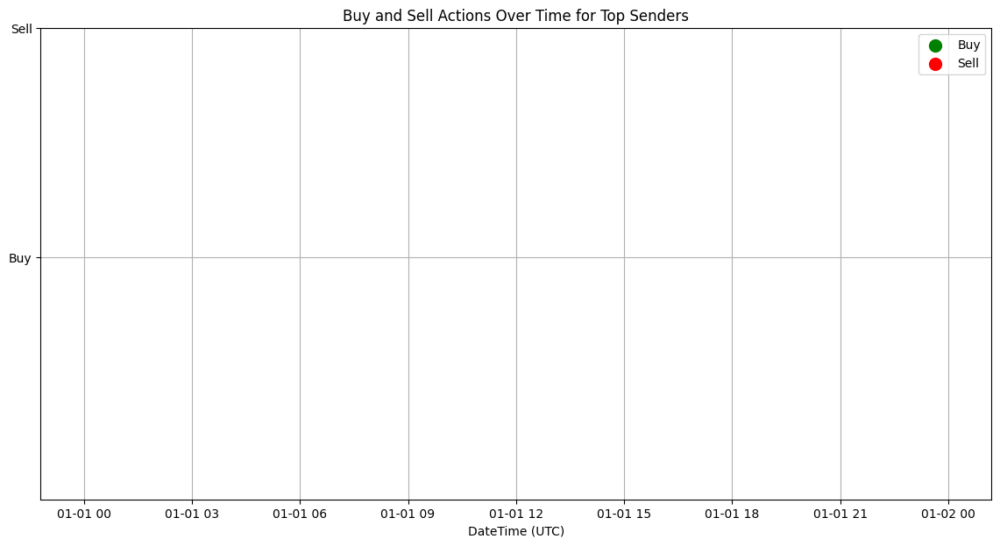

In [ ]:
import matplotlib.pyplot as plt

# Assuming you're analyzing the top senders for demonstration
plt.figure(figsize=(14,7))

# Plot buy dates
buy_dates = top_senders_buy.groupby('DateTime (UTC)').size().index
plt.scatter(buy_dates, [1]*len(buy_dates), color='green', label='Buy', s=100)

# Plot sell dates
sell_dates = top_senders_sell.groupby('DateTime (UTC)').size().index
plt.scatter(sell_dates, [2]*len(sell_dates), color='red', label='Sell', s=100)

plt.yticks([1, 2], ["Buy", "Sell"])
plt.title("Buy and Sell Actions Over Time for Top Senders")
plt.xlabel("DateTime (UTC)")
plt.legend()
plt.grid(True)
plt.show()